In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his_88params/')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 5):
        traces[trace].append(np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 5):
        logps[trace].append(np.load('earm_dreamz_5chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-1919.20554073]
 [-1919.20554073]
 [-1727.6190302 ]
 ..., 
 [  150.27800433]
 [  150.27800433]
 [  150.27800433]]
Logp of trace:  a  chain:  1  =  [ 149.90049216]
Logp of trace:  a  chain:  2  =  [ 149.50619339]
Logp of trace:  a  chain:  3  =  [ 149.89315681]
Logp of trace:  a  chain:  4  =  [ 151.98523275]
Logp of trace:  b  chain: 0 =  [[-3688.53984076]
 [-3204.76824176]
 [-3201.75090147]
 ..., 
 [  153.93870928]
 [  153.93870928]
 [  153.93870928]]
Logp of trace:  b  chain:  1  =  [ 151.03506626]
Logp of trace:  b  chain:  2  =  [ 153.41503686]
Logp of trace:  b  chain:  3  =  [ 152.22133402]
Logp of trace:  b  chain:  4  =  [ 150.78246745]
Logp of trace:  c  chain: 0 =  [[-4939.92251159]
 [-4061.69839068]
 [-4061.69839068]
 ..., 
 [  152.57839691]
 [  152.57839691]
 [  152.57839691]]
Logp of trace:  c  chain:  1  =  [ 149.93402268]
Logp of trace:  c  chain:  2  =  [ 151.82672435]
Logp of trace:  c  chain:  3  =  [ 153.26499387]
Logp of trace:  c  c

In [5]:
traces['a'][0][:,72]

array([-1.14195657, -1.14195657, -1.11648337, ...,  3.29127882,
        3.29127882,  3.29127882])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  44  of  88  parameters.
Percent of parameters with GR below 1.2:  50.0
Number of parameters with GR below 1.1:  18  of  88  parameters.
Percent of parameters with GR below 1.1:  20.4545454545


[44, 50.0, 18, 20.454545454545457]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  35  of  88  parameters.
Percent of parameters with GR below 1.2:  39.7727272727
Number of parameters with GR below 1.1:  10  of  88  parameters.
Percent of parameters with GR below 1.1:  11.3636363636


[35, 39.77272727272727, 10, 11.363636363636363]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  28  of  88  parameters.
Percent of parameters with GR below 1.2:  31.8181818182
Number of parameters with GR below 1.1:  6  of  88  parameters.
Percent of parameters with GR below 1.1:  6.81818181818


[28, 31.818181818181817, 6, 6.8181818181818175]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  43  of  88  parameters.
Percent of parameters with GR below 1.2:  48.8636363636
Number of parameters with GR below 1.1:  22  of  88  parameters.
Percent of parameters with GR below 1.1:  25.0


[43, 48.86363636363637, 22, 25.0]

50000
5
50000


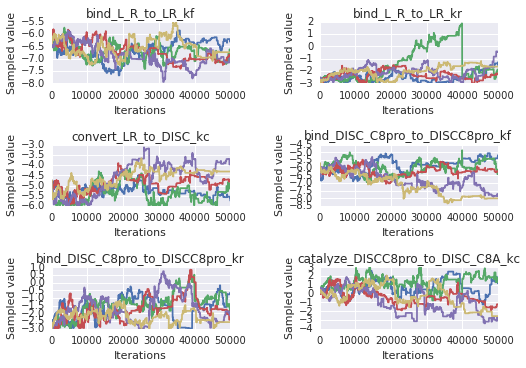

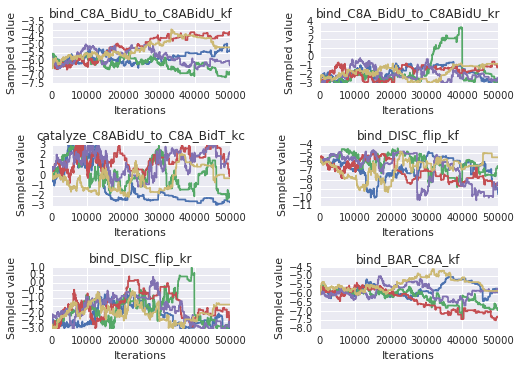

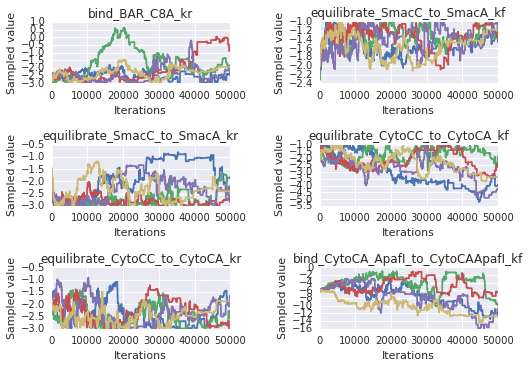

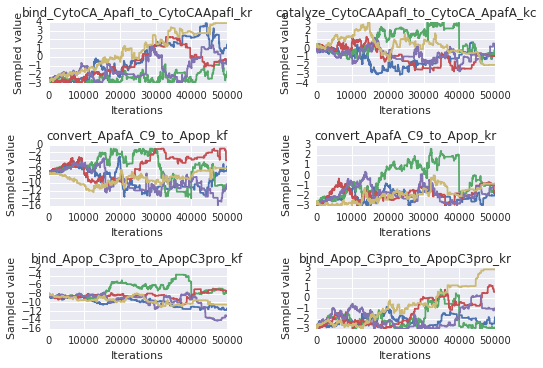

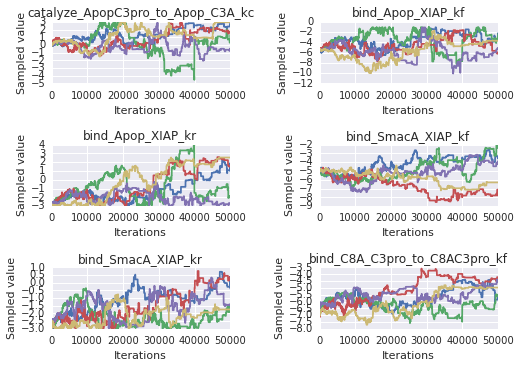

...

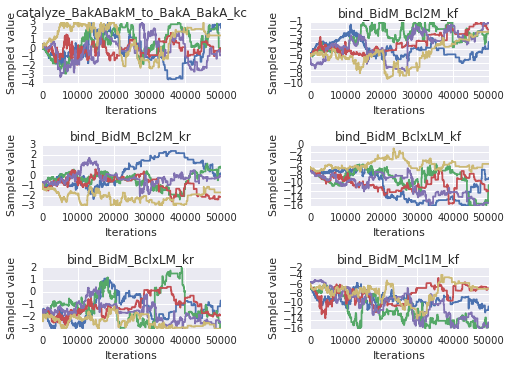

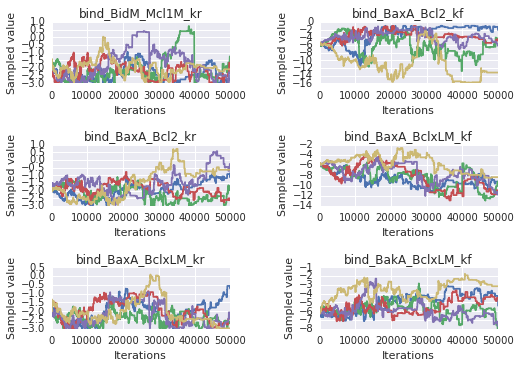

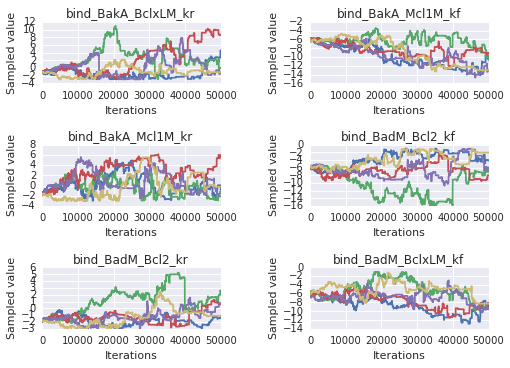

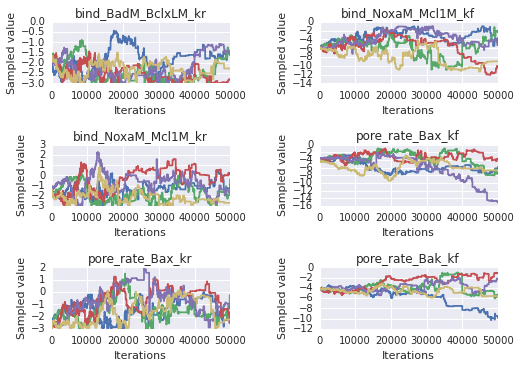

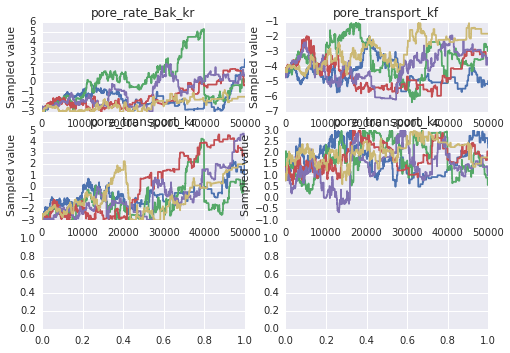

In [11]:
sample_plots(param_trace_dicts['a'])

In [12]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


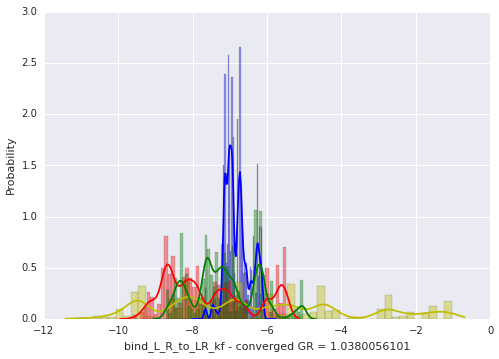

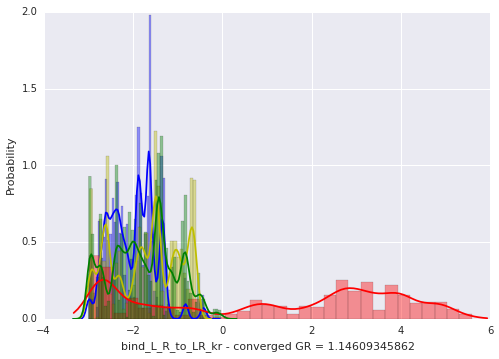

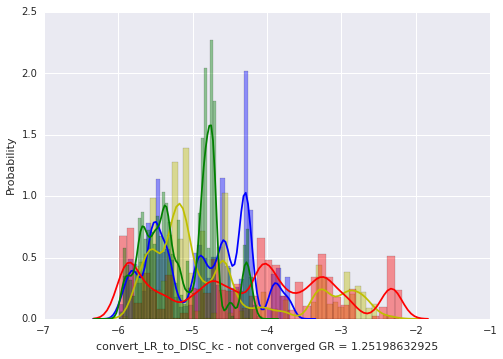

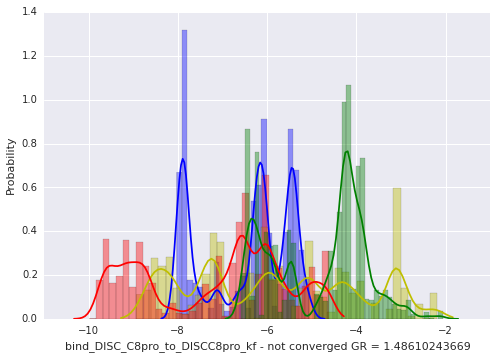

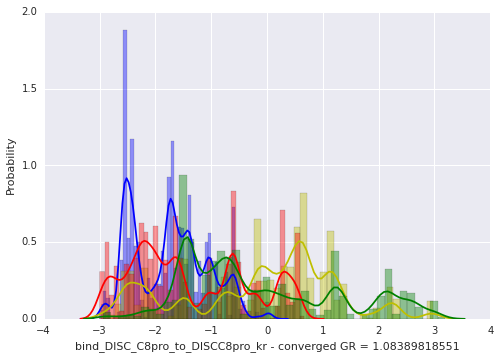

...

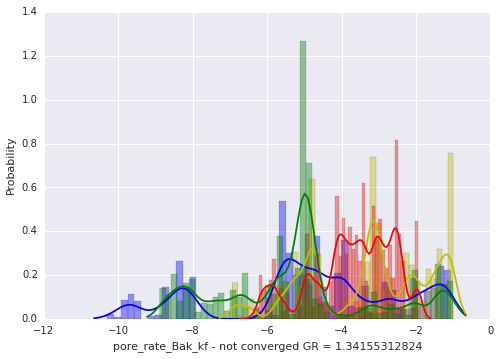

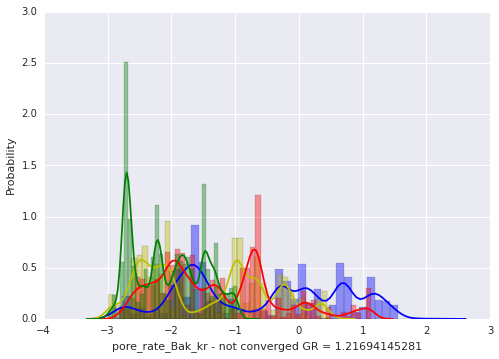

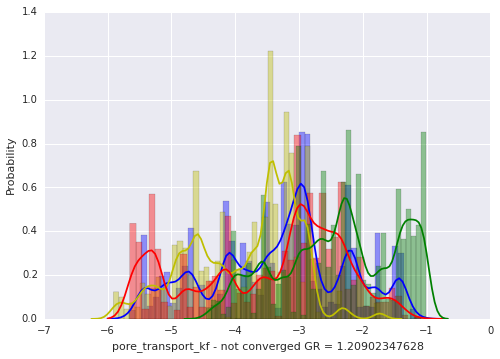

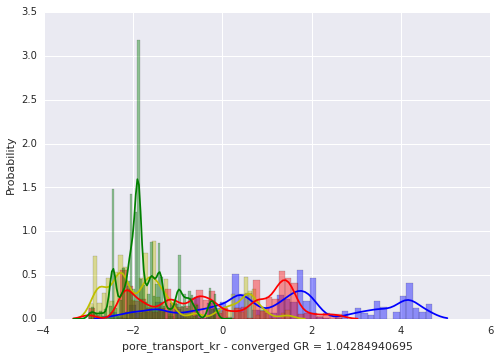

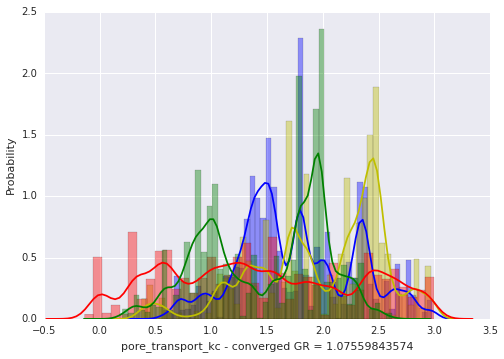

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.16809805, -6.16809805, -6.16455414, ..., -6.70205785,
       -6.70205785, -6.70205785])

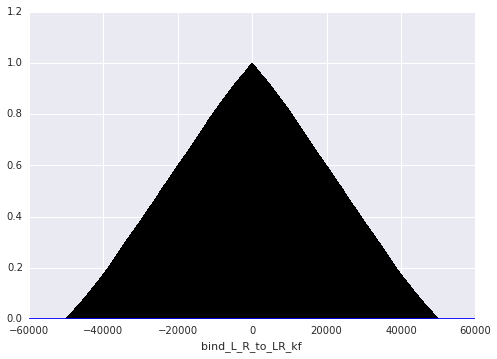

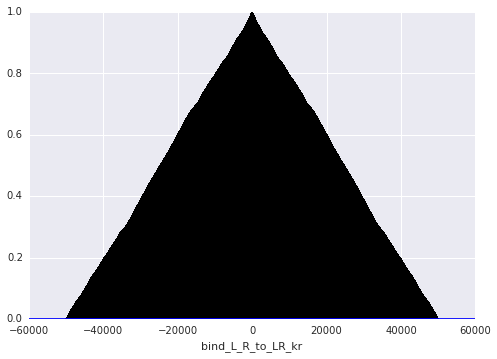

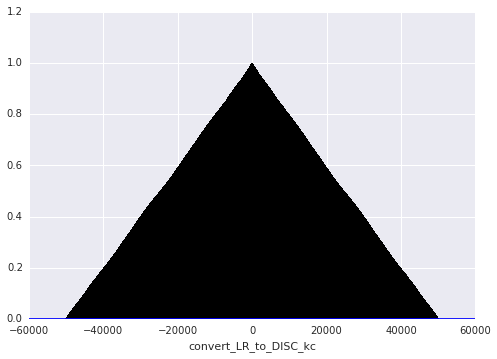

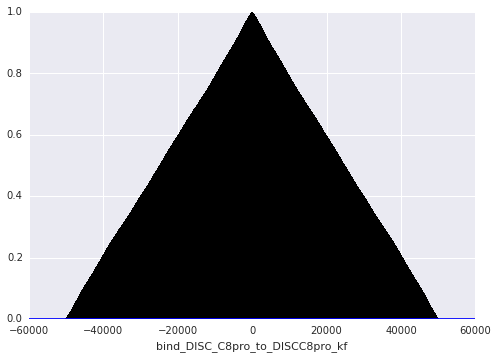

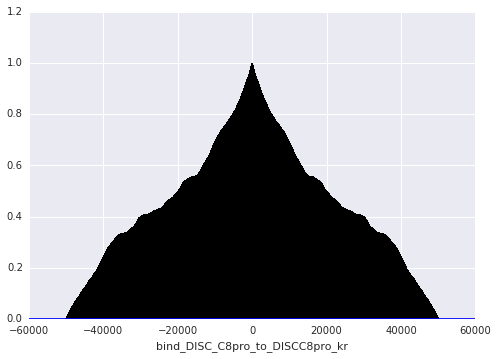

...

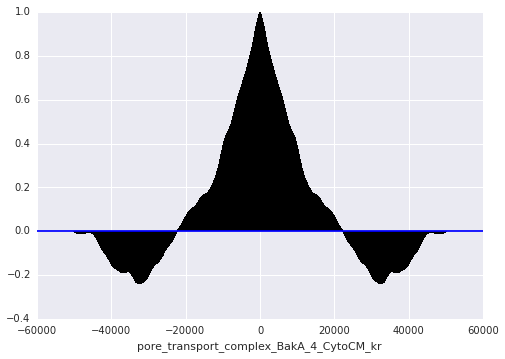

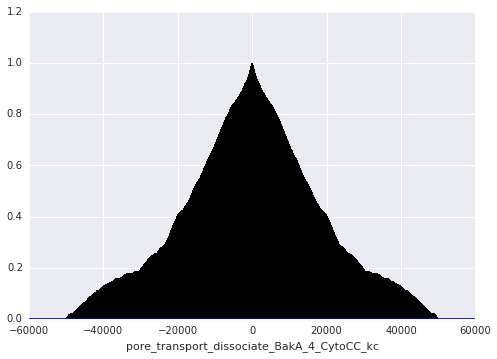

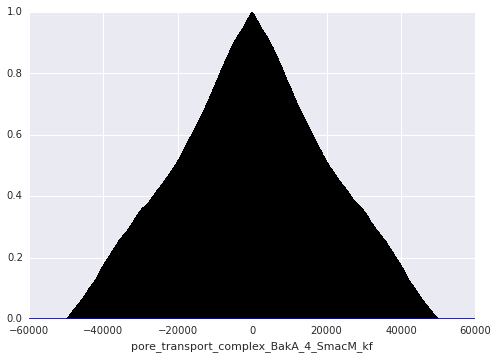

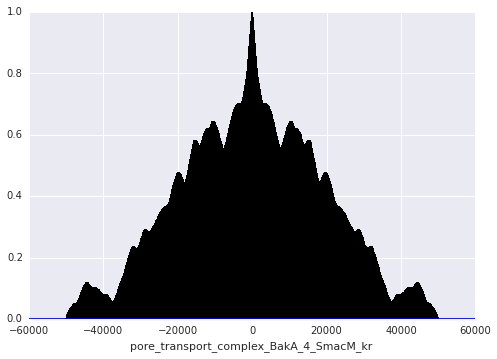

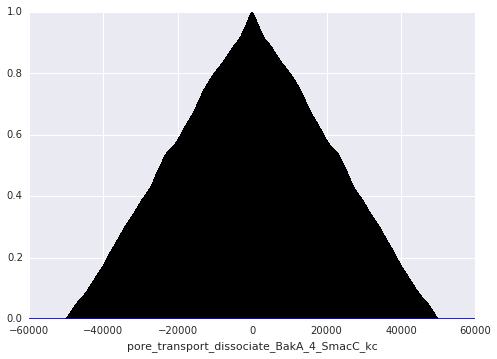

In [21]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

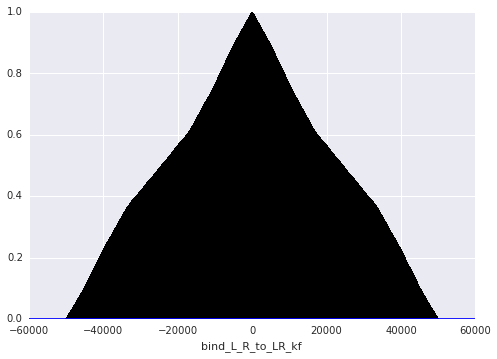

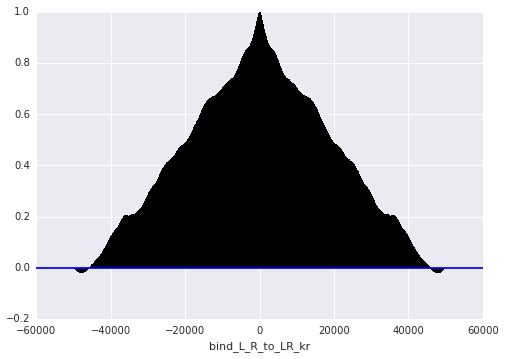

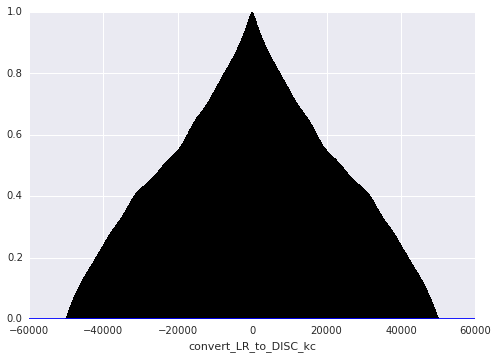

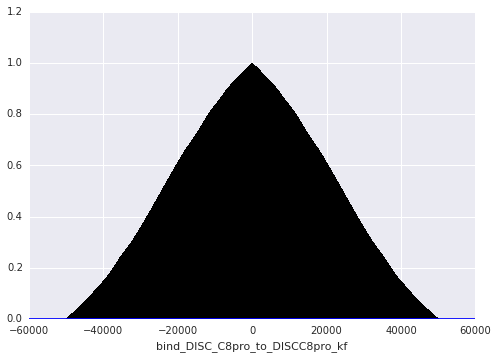

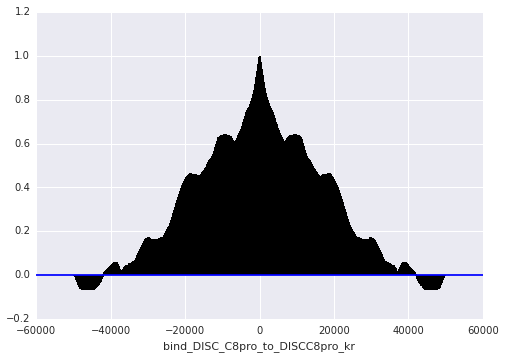

...

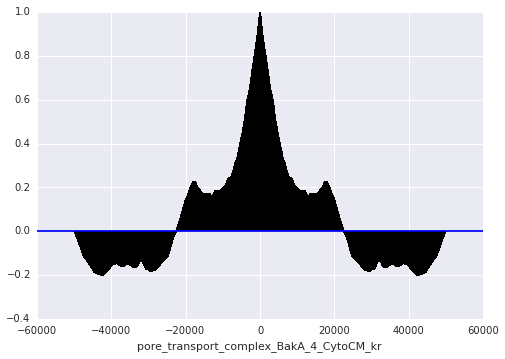

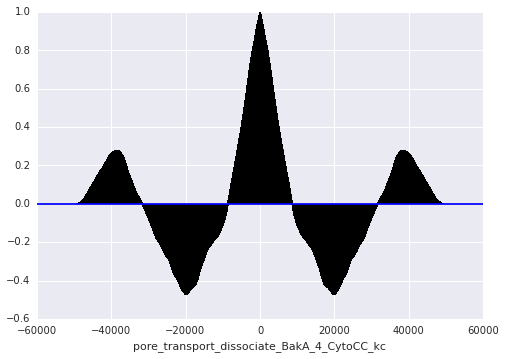

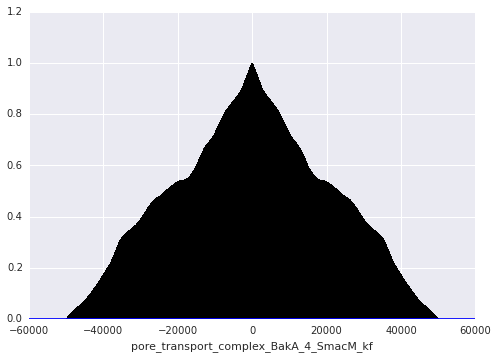

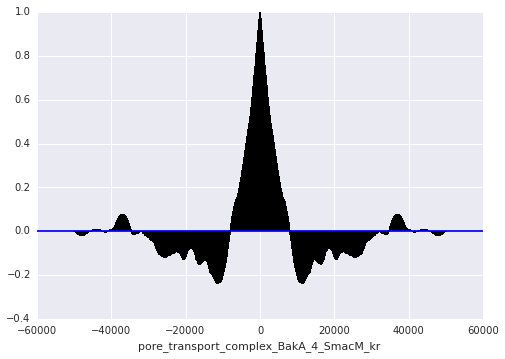

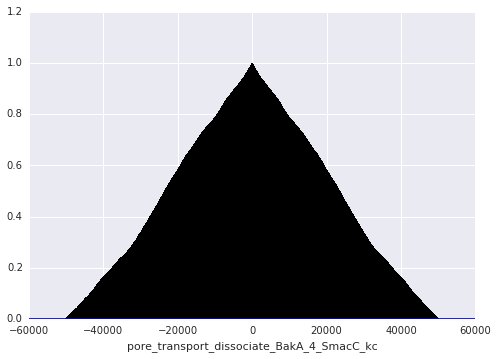

In [22]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

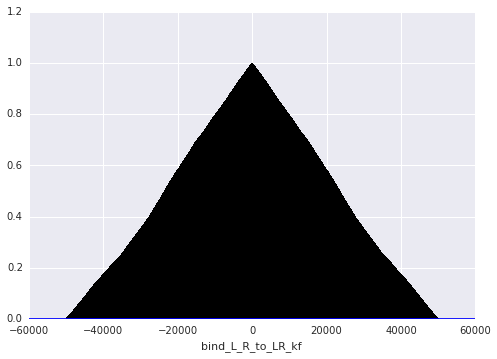

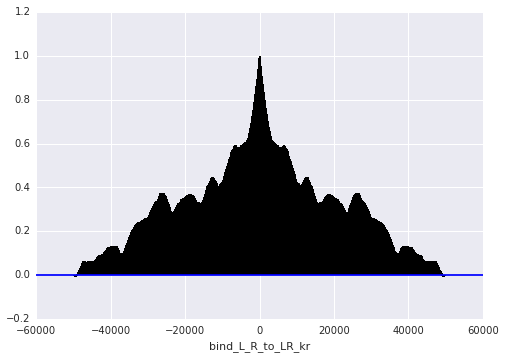

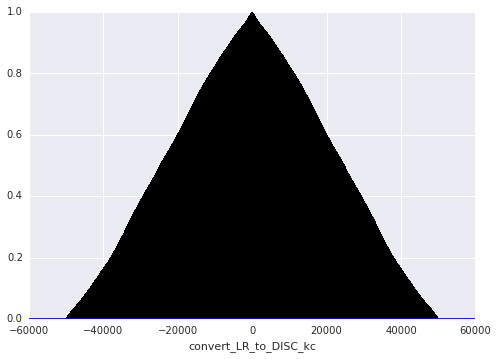

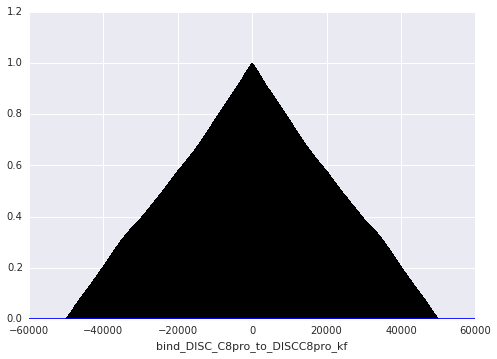

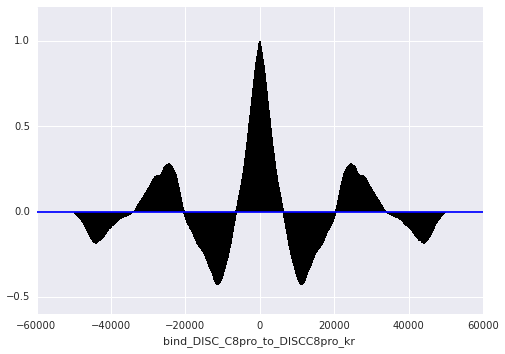

...

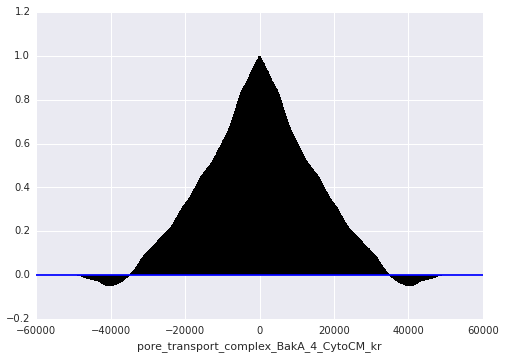

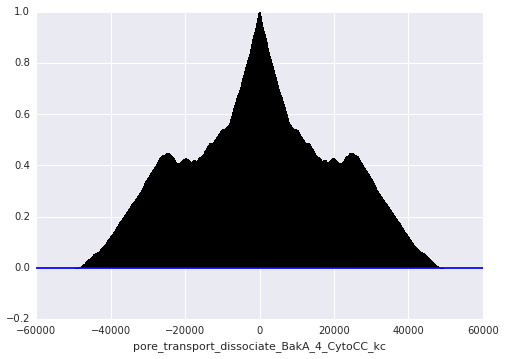

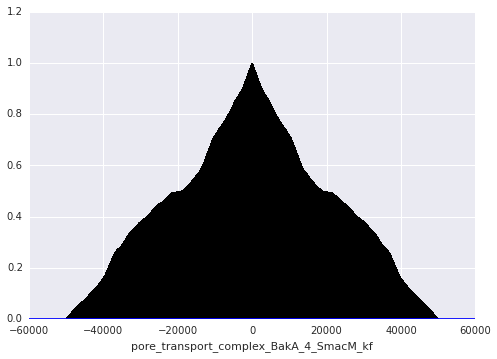

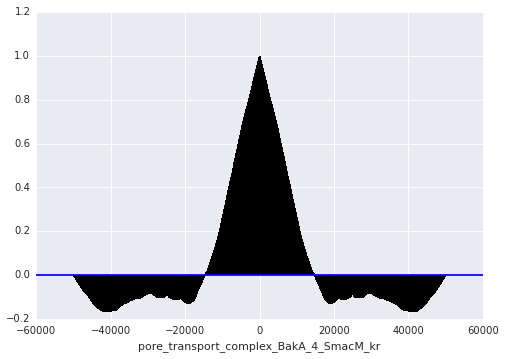

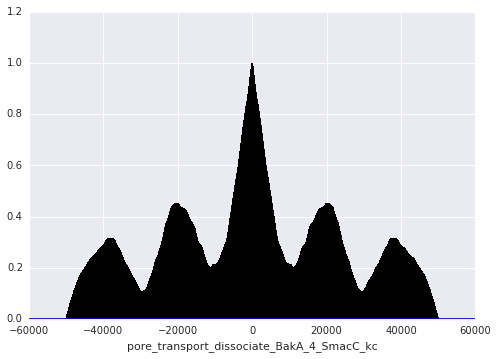

In [23]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [15]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
for dim in range(len(traces['a'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][0])):
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  739  acceptance rate:  0.01478
N acceptances for parameter:  bind_L_R_to_LR_kr  =  746  acceptance rate:  0.01492
N acceptances for parameter:  convert_LR_to_DISC_kc  =  726  acceptance rate:  0.01452
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  707  acceptance rate:  0.01414
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  747  acceptance rate:  0.01494
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  772  acceptance rate:  0.01544
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  744  acceptance rate:  0.01488
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  762  acceptance rate:  0.01524
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  698  acceptance rate:  0.01396
N acceptances for parameter:  bind_DISC_flip_kf  =  728  acceptance rate:  0.01456
N acceptances for parameter:  bind_DISC_flip_kr  =  740  acceptance rate:  0.0148
N acce

array([ 0.01478,  0.01492,  0.01452,  0.01414,  0.01494,  0.01544,
        0.01488,  0.01524,  0.01396,  0.01456,  0.0148 ,  0.0148 ,
        0.01474,  0.01468,  0.01502,  0.01508,  0.01496,  0.01518,
        0.01552,  0.01506,  0.0152 ,  0.01514,  0.01508,  0.01518,
        0.0149 ,  0.01534,  0.01484,  0.01508,  0.01462,  0.01444,
        0.01484,  0.0151 ,  0.0145 ,  0.01492,  0.01516,  0.01462,
        0.01546,  0.01492,  0.01424,  0.0151 ,  0.0151 ,  0.01458,
        0.01562,  0.01532,  0.01502,  0.01522,  0.01506,  0.0148 ,
        0.01534,  0.01462,  0.01544,  0.01514,  0.01462,  0.01474,
        0.0151 ,  0.0148 ,  0.01522,  0.0145 ,  0.01506,  0.01538,
        0.01532,  0.01468,  0.01466,  0.01504,  0.01518,  0.01526,
        0.0148 ,  0.0149 ,  0.01506,  0.0151 ,  0.01524,  0.01494,
        0.0153 ,  0.01486,  0.01508,  0.01476,  0.01484,  0.01508,
        0.01504,  0.01476,  0.0153 ,  0.01524,  0.0153 ,  0.01492,
        0.01532,  0.01476,  0.01534,  0.01494])

In [16]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
for dim in range(len(traces['a'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  789  acceptance rate:  0.01578
N acceptances for parameter:  bind_L_R_to_LR_kr  =  791  acceptance rate:  0.01582
N acceptances for parameter:  convert_LR_to_DISC_kc  =  798  acceptance rate:  0.01596
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  795  acceptance rate:  0.0159
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  795  acceptance rate:  0.0159
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  807  acceptance rate:  0.01614
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  765  acceptance rate:  0.0153
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  814  acceptance rate:  0.01628
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  794  acceptance rate:  0.01588
N acceptances for parameter:  bind_DISC_flip_kf  =  784  acceptance rate:  0.01568
N acceptances for parameter:  bind_DISC_flip_kr  =  802  acceptance rate:  0.01604
N accept

array([ 0.01578,  0.01582,  0.01596,  0.0159 ,  0.0159 ,  0.01614,
        0.0153 ,  0.01628,  0.01588,  0.01568,  0.01604,  0.01594,
        0.0161 ,  0.01596,  0.01604,  0.01594,  0.0163 ,  0.01582,
        0.01636,  0.01624,  0.01572,  0.0163 ,  0.01602,  0.01636,
        0.01646,  0.016  ,  0.01568,  0.01562,  0.01616,  0.01526,
        0.01634,  0.01614,  0.01564,  0.01622,  0.01568,  0.01582,
        0.01568,  0.01614,  0.01604,  0.01594,  0.01578,  0.0158 ,
        0.01626,  0.0158 ,  0.01574,  0.0163 ,  0.0157 ,  0.01608,
        0.01608,  0.01552,  0.01582,  0.01594,  0.01616,  0.01612,
        0.01614,  0.01596,  0.01598,  0.01618,  0.01612,  0.01596,
        0.01586,  0.01616,  0.0164 ,  0.01642,  0.01648,  0.0163 ,
        0.01634,  0.0163 ,  0.01622,  0.01604,  0.01676,  0.01634,
        0.0158 ,  0.01608,  0.01614,  0.0162 ,  0.0161 ,  0.0161 ,
        0.0164 ,  0.01646,  0.01632,  0.01618,  0.0162 ,  0.01594,
        0.01628,  0.0159 ,  0.01618,  0.0162 ])

In [17]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  776  acceptance rate:  0.01552
N acceptances for parameter:  bind_L_R_to_LR_kr  =  781  acceptance rate:  0.01562
N acceptances for parameter:  convert_LR_to_DISC_kc  =  733  acceptance rate:  0.01466
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  738  acceptance rate:  0.01476
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  801  acceptance rate:  0.01602
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  783  acceptance rate:  0.01566
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  758  acceptance rate:  0.01516
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  779  acceptance rate:  0.01558
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  790  acceptance rate:  0.0158
N acceptances for parameter:  bind_DISC_flip_kf  =  787  acceptance rate:  0.01574
N acceptances for parameter:  bind_DISC_flip_kr  =  783  acceptance rate:  0.01566
N acce

array([ 0.01552,  0.01562,  0.01466,  0.01476,  0.01602,  0.01566,
        0.01516,  0.01558,  0.0158 ,  0.01574,  0.01566,  0.01522,
        0.01516,  0.01552,  0.01562,  0.01546,  0.01578,  0.01576,
        0.01524,  0.0156 ,  0.01586,  0.01574,  0.01548,  0.01538,
        0.01578,  0.01614,  0.01532,  0.01576,  0.01562,  0.01528,
        0.0153 ,  0.01484,  0.01482,  0.0156 ,  0.01584,  0.01542,
        0.01538,  0.01578,  0.01504,  0.01576,  0.01564,  0.01576,
        0.0155 ,  0.01548,  0.01564,  0.01542,  0.01564,  0.0157 ,
        0.01538,  0.0152 ,  0.01558,  0.0157 ,  0.01546,  0.01558,
        0.01596,  0.01518,  0.01524,  0.0156 ,  0.01562,  0.01582,
        0.01542,  0.01522,  0.01596,  0.01612,  0.01566,  0.01514,
        0.0153 ,  0.01492,  0.01582,  0.01568,  0.01528,  0.01556,
        0.01618,  0.01546,  0.01572,  0.01572,  0.0157 ,  0.0153 ,
        0.01576,  0.01542,  0.0161 ,  0.01626,  0.01646,  0.01582,
        0.01574,  0.01576,  0.0158 ,  0.0157 ])

In [18]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  776  acceptance rate:  0.01552
N acceptances for parameter:  bind_L_R_to_LR_kr  =  781  acceptance rate:  0.01562
N acceptances for parameter:  convert_LR_to_DISC_kc  =  733  acceptance rate:  0.01466
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  738  acceptance rate:  0.01476
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  801  acceptance rate:  0.01602
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  783  acceptance rate:  0.01566
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  758  acceptance rate:  0.01516
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  779  acceptance rate:  0.01558
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  790  acceptance rate:  0.0158
N acceptances for parameter:  bind_DISC_flip_kf  =  787  acceptance rate:  0.01574
N acceptances for parameter:  bind_DISC_flip_kr  =  783  acceptance rate:  0.01566
N acce

array([ 0.01552,  0.01562,  0.01466,  0.01476,  0.01602,  0.01566,
        0.01516,  0.01558,  0.0158 ,  0.01574,  0.01566,  0.01522,
        0.01516,  0.01552,  0.01562,  0.01546,  0.01578,  0.01576,
        0.01524,  0.0156 ,  0.01586,  0.01574,  0.01548,  0.01538,
        0.01578,  0.01614,  0.01532,  0.01576,  0.01562,  0.01528,
        0.0153 ,  0.01484,  0.01482,  0.0156 ,  0.01584,  0.01542,
        0.01538,  0.01578,  0.01504,  0.01576,  0.01564,  0.01576,
        0.0155 ,  0.01548,  0.01564,  0.01542,  0.01564,  0.0157 ,
        0.01538,  0.0152 ,  0.01558,  0.0157 ,  0.01546,  0.01558,
        0.01596,  0.01518,  0.01524,  0.0156 ,  0.01562,  0.01582,
        0.01542,  0.01522,  0.01596,  0.01612,  0.01566,  0.01514,
        0.0153 ,  0.01492,  0.01582,  0.01568,  0.01528,  0.01556,
        0.01618,  0.01546,  0.01572,  0.01572,  0.0157 ,  0.0153 ,
        0.01576,  0.01542,  0.0161 ,  0.01626,  0.01646,  0.01582,
        0.01574,  0.01576,  0.0158 ,  0.0157 ])